In [1]:
import numpy as np
from scipy import fft, signal
import scipy as sp
from matplotlib import pyplot as plt
import matplotlib.animation

from IPython.display import HTML, Image

import schemdraw
from schemdraw import flow
import schemdraw as schem
import schemdraw.elements as e
from schemdraw import dsp

%config InlineBackend.figure_formats = ['svg']

import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=DeprecationWarning)

from IPython.core.display import HTML
HTML("""
<style>
.jp-RenderedImage{
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
.jp-RenderedSVG{
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
.RenderedHTMLCommon{
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

 


The calculation of single sinusoidal components in the time domain can be very inefficient
for a large number of partials:  Every partial has to be added individually for every sample - and the *instantaneous amplitude* has to be calculatd for every sample.
IFFT synthesis can be used to compose spectra in the frequency domain, resulting in significantly less operations for many partials.


The IFFT synthesis algorithm can be used to synthesize any kind of additive sound (composed ov partials).
For a known set of partial trajectories, the algorithm follows these steps:


- 1: Create empty spectrum (half).
- 2: Calculate partial positions.
- 3: Calculate partials' phases.
- 3: Place complex kernels in spectum.
- 4: Crate second half (complex conjugate mirror image).
- 5: Calculate IFFT.
- 6: Concatenate frames by either:
    - a: OLA (overlap-add)
    - b: NOLA (non-overlap-add)





------

# Spectral Kernels


The spectral kernels $K$ in the IFFT synthesis represent  **truncated versions of the Fourier transform of a windowed sine**.
A kernel can (must) be calculated for every frequeny and phase of a sine wave. 
The following example shows how a kernel is generated from a time-domain *template* for a single frequuency and phase.

----

## Time-Domain Template

The time-domain template for a sine wave $x_i[n]$, multiplied with a hann window $w[n]$.
$2[n]$ is referred to as the **analysis window**.


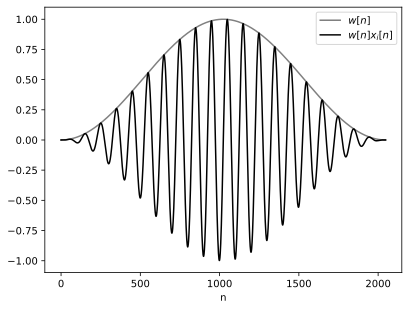

In [2]:
# display(Image("../images/ifft/ifft-0.png"))

N = 1024*2

t = np.linspace(int(-N/2), int(N/2), N)

x = np.sin(2*np.pi*0.01*t)

w = signal.windows.hann(N)

k = w*x

plt.plot(w, 'gray', label='$w[n]$')

plt.plot(k, 'black', label='$w[n] x_i[n]$')
plt.xlabel('n')
plt.legend()
plt.show();

----

## Transform

Taking the Fourier transform of the windowed sine shown above, the spectrum results in the well-known complex *sinc-like* structure. 
We can see in the plot below that - even without truncation - the transform has less than 10 **significant bins**.

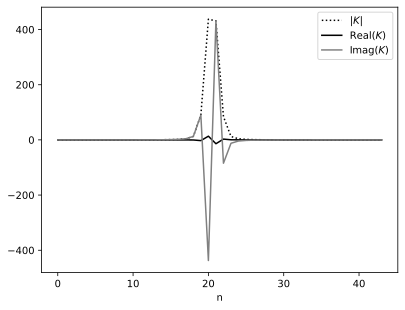

In [3]:
K = fft.fft(k)
plt.plot(np.abs(K[0:44]),'k:', label='$|K|$')
plt.plot(np.real(K[0:44]),'k', label='Real($K$)')
plt.plot(np.imag(K[0:44]),'gray', label='Imag($K)$')
plt.xlabel('n')
plt.legend();

------

# Many Kernels

## Frequency Offset

The kernel changes in relation to its position between two neighboring FFT bins.
In the following interactive plot, the kernel is moved from one bin to the other:

In [4]:
fig = plt.figure(figsize=(10, 4))


N = 1024*2
t = np.linspace(int(-N/2), int(N/2), N)
n = np.linspace(1,N,N)
x = np.sin(2*np.pi*0.01*t)
w = signal.windows.hann(N)

k = w*x

K = fft.fft(k)


ax1 = plt.subplot(1,2,1)
win,  = ax1.plot(w, 'gray', label='w[n]')
sig,  = ax1.plot(k, 'black', label='w[n] x[n]')
#ax1.legend(['Real (cosine)','Imag (sine)'], loc='lower right')#, bbox_to_anchor=(0, 0.5))
ax1.set_xlabel('$n$')
#ax1.set_ylabel('$e^{-j 2 \pi k n/N}$')
#ax1.set_ylim([-1.1,1.1])
plt.legend()

ax2 = plt.subplot(1,2,2)
Sabs,  = ax2.plot(np.abs(K),'k:', label='$|K|$')
Srea,  = ax2.plot(np.real(K),'k', label='Real($K$)')
Sima,  = ax2.plot(np.imag(K),'gray', label='Imag($K)$')
plt.xlim([0,20])

plt.legend();

 


def animate(off):

    x = np.sin(2*np.pi * (0.0049+0.00005*off/10) *t)
    w = signal.windows.hann(N)
    k = w*x
    
    win.set_data(n,w)
    sig.set_data(n,k)



    K = fft.fft(k)
    Sabs.set_data(n,abs(K)) 
    Srea.set_data(n,np.real(K)) 
    Sima.set_data(n,np.imag(K)) 
    

plt.tight_layout();
a = matplotlib.animation.FuncAnimation(fig, animate, 100);
plt.close()
from IPython.display import HTML
HTML(a.to_jshtml())

---

## Phase Offset

For every relative phase $\varphi_i$, the kernel will have a different structure, specifically in respect to the real and imaginary parts.
The following interactive plot shows how the kernel changes when shifting the phase from $0$ to $\pi$:

In [5]:
fig = plt.figure(figsize=(10, 4))


N = 1024*2
t = np.linspace(int(-N/2), int(N/2), N)
n = np.linspace(1,N,N)
x = np.sin(2*np.pi*0.01*t)
w = signal.windows.hann(N)

k = w*x

K = fft.fft(k)


ax1 = plt.subplot(1,2,1)
win,  = ax1.plot(w, 'gray', label='w[n]')
sig,  = ax1.plot(k, 'black', label='w[n] x[n]')
#ax1.legend(['Real (cosine)','Imag (sine)'], loc='lower right')#, bbox_to_anchor=(0, 0.5))
ax1.set_xlabel('$n$')
#ax1.set_ylabel('$e^{-j 2 \pi k n/N}$')
#ax1.set_ylim([-1.1,1.1])
plt.legend()

ax2 = plt.subplot(1,2,2)
Sabs,  = ax2.plot(np.abs(K),'k:', label='$|K|$')
Srea,  = ax2.plot(np.real(K),'k', label='Real($K$)')
Sima,  = ax2.plot(np.imag(K),'gray', label='Imag($K)$')
plt.xlim([0,20])

plt.legend();

 


def animate(off):

    
    x = np.sin(2*np.pi * (0.0049) *t + (2*np.pi*off/100))
    w = signal.windows.hann(N)
    k = w*x
    
    win.set_data(n,w)
    sig.set_data(n,k)



    K = fft.fft(k)
    Sabs.set_data(n,abs(K)) 
    Srea.set_data(n,np.real(K)) 
    Sima.set_data(n,np.imag(K)) 
    

plt.tight_layout();
a = matplotlib.animation.FuncAnimation(fig, animate, 100);
plt.close()
from IPython.display import HTML
HTML(a.to_jshtml())

------

# Overlap-Add


In the OLA approach, neighboring frames are stitched together with an overlap to avoid discontinuities between frames.
These time-domain windows - or **synthesis windows** -  have to overlap to result in a constant gain of $1$. 
The triangular window is perfect for this: 


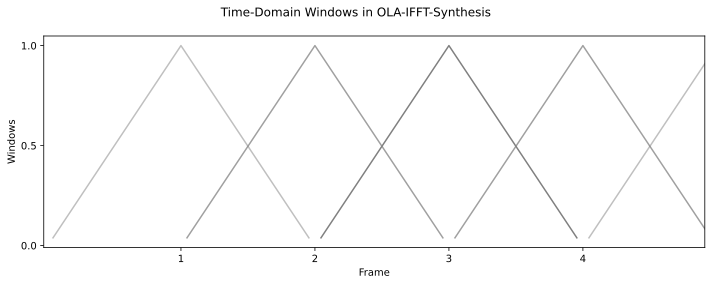

In [6]:
N = 51

f = np.linspace(-6,6,N)
w = signal.windows.triang(N)

plt.figure(figsize=(10, 4))

s = np.linspace(-2*2*np.pi,2*2*np.pi,5)

for i in [-2,-1,0,1,2]:

    plt.plot(f+i*2*np.pi,w,'gray',alpha=1-abs(0.5*i/2))



plt.xticks(s,labels=[1,2,3,4,5])
plt.yticks([0, 0.5, 1])


plt.suptitle("Time-Domain Windows in OLA-IFFT-Synthesis")
plt.ylabel("Windows")
plt.xlabel("Frame")

plt.xlim([-19,12])
plt.tight_layout()


After getting our time-domain frames by IFFT, they need to be multiplied with the triangular window before overlap-adding them.




-----

## Phase Matching

When using OLA IFFT synthesis with the triangular windows above, we need to make sure that the phases of overlapping windows align when both frames are contributing equally.



In [7]:

from IPython.display import IFrame
IFrame("../images/overlap_sine.pdf", width=600, height=300)


